<a href="https://colab.research.google.com/github/brialorelle/headcam-objects/blob/master/Train_Detectron2_using_Custom_COCO_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Overview of this notebook

We modified the Detectron2 tutorial for training models using a custom dataset and run it on sample annotated frames that we formatted using the MTurkOutputToCOCOJSON.ipynb notebook.

# Install detectron2 and dependencies

In [ ]:
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2019 NVIDIA Corporation
Built on Sun_Jul_28_19:07:16_PDT_2019
Cuda compilation tools, release 10.1, V10.1.243


In [ ]:
# install dependencies: Pillow-7.2.0 detectron2-0.2.1+cu101 fvcore-0.1.1.post20200716 mock-4.0.2 portalocker-2.0.0 yacs-0.1.7
!pip install pyyaml==5.3.1 pycocotools>=2.0.1 imgaug==0.2.6

In [ ]:
#torch issues
#!pip install torch 1.6.0, 0.7.0
#!pip install torchvision
#!pip install --upgrade torchvision>=0.6.0
#! pip install torch==1.5.0+cpu torchvision==0.5.0+cpu -f https://download.pytorch.org/whl/torch_stable.html
#! pip install torch==1.5.0+cu101 torchvision==0.6.0+cu101 -f https://download.pytorch.org/whl/torch_stable.html

Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 703.8MB 26kB/s 


In [ ]:
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

1.6.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [ ]:
# install detectron2: (colab has CUDA 10.1 + torch 1.6)
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
#assert torch.__version__.startswith("1.5")
#!pip install detectron2==0.2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html
     |████████████████████████████████| 6.6MB 4.1MB/s 
     |████████████████████████████████| 2.2MB 4.6MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.1.post20200716-cp36-none-any.whl size=42325 sha256=8982b770d2d539c53c0a919919efd5a63808d75f74f11cbbe5a838c325034f76
  Stored in directory: /root/.cache/pip/wheels/81/99/f4/42a6bef61c07b3d78dfe6d7ebff259444c4526504cf72378d7
Successfully built fvcore
  Found existing installation: Pillow 7.0.0
    Uninstalling Pillow-7.0.0:
      Successfully uninstalled Pillow-7.0.0


# Import libraries and mount Google Drive

In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
!pip -q install boto3
!pip install xmltodict

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


# Setting up Colab for use with GitHub repository

If this is the first time, navigate to the correct folder in personal drive and clone the repo

In [ ]:
%cd drive/My Drive/LangCog/
! git clone https://github.com/brialorelle/headcam-objects.git

[Errno 2] No such file or directory: 'drive/My Drive/LangCog/'
/content/drive/My Drive/LangCog
Cloning into 'headcam-objects'...
remote: Enumerating objects: 24, done.
remote: Counting objects: 100% (24/24), done.
remote: Compressing objects: 100% (22/22), done.
remote: Total 24 (delta 6), reused 13 (delta 1), pack-reused 0
Unpacking objects: 100% (24/24), done.


Else, navigate to the repository and pull!



In [ ]:
%cd drive/My Drive/LangCog/headcam-objects

In [ ]:
! git pull

remote: Enumerating objects: 10, done.
remote: Counting objects: 100% (10/10), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 9 (delta 3), reused 9 (delta 3), pack-reused 0
Unpacking objects: 100% (9/9), done.
From https://github.com/brialorelle/headcam-objects
   66a5c17..f26940a  master     -> origin/master
Updating 66a5c17..f26940a
Fast-forward
 Formatted Labelled Frames/pilotData1.json   |    1 +
 Formatted Labelled Frames/pilotData2.json   |    1 +
 Formatted Labelled Frames/smallBatch.json   |    1 +
 Formatted Labelled Frames/toyData.json      |    1 +
 interesting_image_list.txt                  | 1542 +++++++++++++++++++++++++++
 wordbank_object_list.txt => object_list.txt |    0
 pilotImageURLs.csv                          |  151 +++
 7 files changed, 1697 insertions(+)
 create mode 100644 Formatted Labelled Frames/pilotData1.json
 create mode 100644 Formatted Labelled Frames/pilotData2.json
 create mode 100644 Formatted Labelled Frames/smallBatch.json
 cr

# Train on a custom dataset

In this section, we show how to train an existing detectron2 model on a custom dataset in a new format.

We use [the dataset we made using MTurk annotations](https://colab.research.google.com/drive/1JFOI2Q-07CLAK9Xp2MJGYdLE8DZ2_FHd?usp=sharing).

We'll train a model from an existing model pre-trained on COCO dataset, available in detectron2's model zoo.


## Prepare the dataset

Register the dataset, which we've converted to COCO JSON format, using Detectron2's built in function.

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("dataset_train", {}, 'https://raw.githubusercontent.com/brialorelle/headcam-objects/master/Formatted%20Labelled%20Frames/pilotData1.json', "")
register_coco_instances("dataset_val", {},  'https://raw.githubusercontent.com/brialorelle/headcam-objects/master/Formatted%20Labelled%20Frames/pilotData2.json', "")
register_coco_instances("dataset_toy", {},  'https://raw.githubusercontent.com/brialorelle/headcam-objects/master/Formatted%20Labelled%20Frames/toyData.json', "")


In [ ]:
register_coco_instances("dataset_pilot", {},  'https://raw.githubusercontent.com/brialorelle/headcam-objects/master/Formatted%20Labelled%20Frames/smallBatch.json'', "")



In order to use OpenCV to visualize our iamges, we use the below function (from https://www.pyimagesearch.com/2015/03/02/convert-url-to-image-with-python-and-opencv/) to convert our image urls to OpenCV format.

In [ ]:
# import the necessary packages
import numpy as np
import urllib
import cv2
# METHOD #1: OpenCV, NumPy, and urllib
def url_to_image(url):
	# download the image, convert it to a NumPy array, and then read
	# it into OpenCV format
	resp = urllib.request.urlopen(url)
	image = np.asarray(bytearray(resp.read()), dtype="uint8")
	image = cv2.imdecode(image, cv2.IMREAD_COLOR)
	# return the image
	return image

In [ ]:
# checking and seeing what we stored
MetadataCatalog.get("my_dataset_train")

Metadata(evaluator_type='coco', image_root='', json_file='/content/drive/My Drive/CSLI/pilotData1.json', name='my_dataset_train1')

In [ ]:
# checking and seeing what we stored
DatasetCatalog.get("my_dataset_train")[0]

[08/05 20:14:15 d2.data.datasets.coco]: Loaded 13 images in COCO format from /content/drive/My Drive/CSLI/pilotData1.json


{'annotations': [{'bbox': [62, 330, 333, 92],
   'bbox_mode': <BoxMode.XYWH_ABS: 1>,
   'category_id': 326,
   'iscrowd': 0},
  {'bbox': [10, 174, 465, 305],
   'bbox_mode': <BoxMode.XYWH_ABS: 1>,
   'category_id': 323,
   'iscrowd': 0}],
 'file_name': 'http://langcog.stanford.edu/expts/saycam/frames/18080-S_20140320_1703_01.mp4-5250.jpg',
 'height': 480,
 'image_id': 5250,
 'width': 640}

To verify the data loading is correct, let's visualize the annotations of one of the images in the set. Note that all annotations are displayed for the given image, meaning that the image has multiple annotations for the same thing. This is a product of COCO JSON format storing annotations by image. **Should we look for a workaround? -NB **

In [ ]:
DatasetCatalog.get("dataset_val")[3]

[08/08 00:35:04 d2.data.datasets.coco]: Loaded 13 images in COCO format from /content/drive/My Drive/CSLI/pilotData2.json


{'annotations': [{'bbox': [349, 126, 279, 292],
   'bbox_mode': <BoxMode.XYWH_ABS: 1>,
   'category_id': 14,
   'iscrowd': 0},
  {'bbox': [224, 58, 161, 272],
   'bbox_mode': <BoxMode.XYWH_ABS: 1>,
   'category_id': 14,
   'iscrowd': 0},
  {'bbox': [101, 0, 119, 219],
   'bbox_mode': <BoxMode.XYWH_ABS: 1>,
   'category_id': 14,
   'iscrowd': 0},
  {'bbox': [60, 315, 221, 165],
   'bbox_mode': <BoxMode.XYWH_ABS: 1>,
   'category_id': 323,
   'iscrowd': 0},
  {'bbox': [154, 216, 96, 95],
   'bbox_mode': <BoxMode.XYWH_ABS: 1>,
   'category_id': 323,
   'iscrowd': 0}],
 'file_name': 'http://langcog.stanford.edu/expts/saycam/frames/21723-S_20141108_2422_01.AVI.mp4-6485.jpg',
 'height': 480,
 'image_id': 6485,
 'width': 640}

WARNING [08/10 21:53:32 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[08/10 21:53:32 d2.data.datasets.coco]: Loaded 10 images in COCO format from /content/drive/My Drive/CSLI/toyData1.json


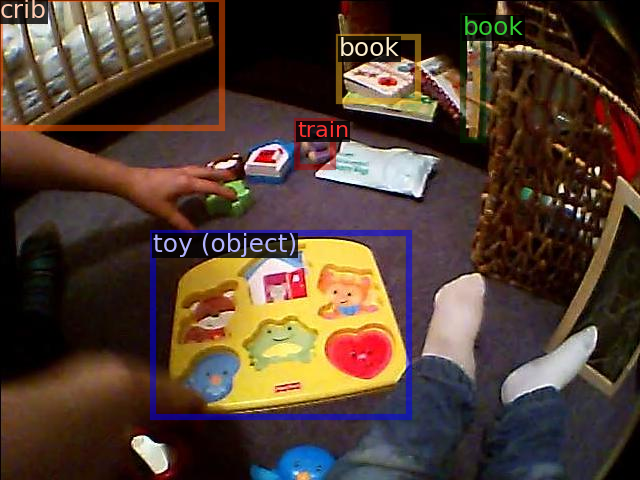

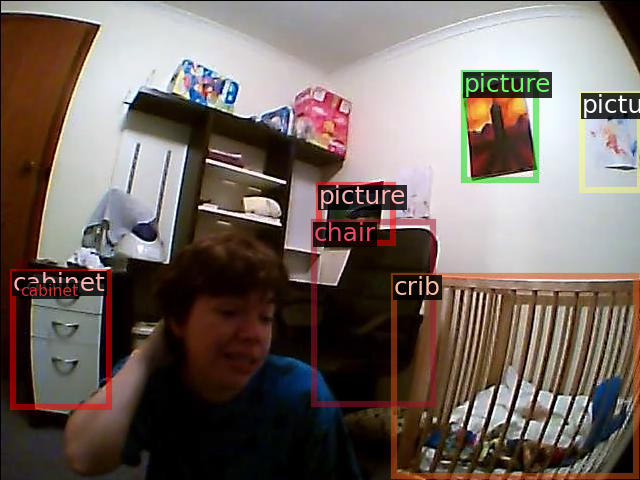

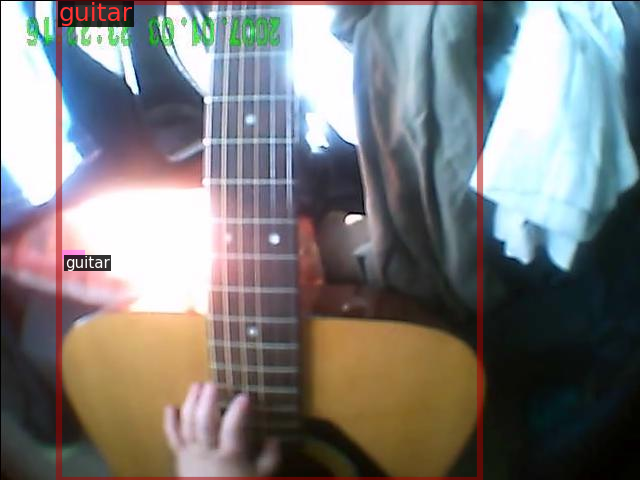

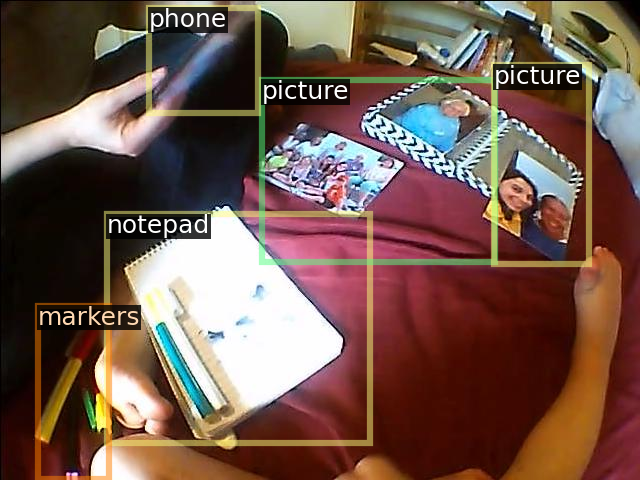

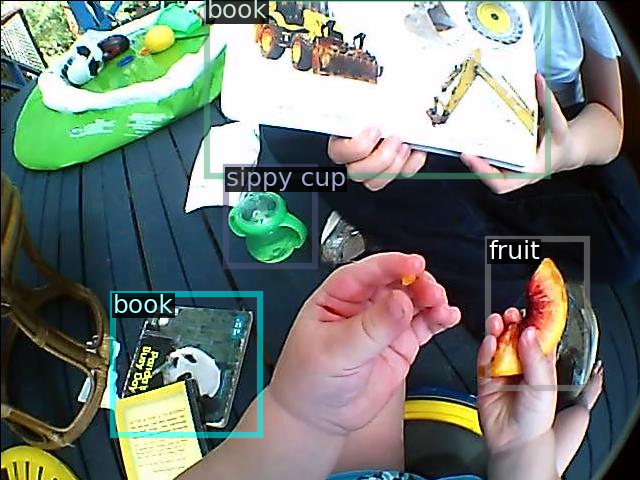

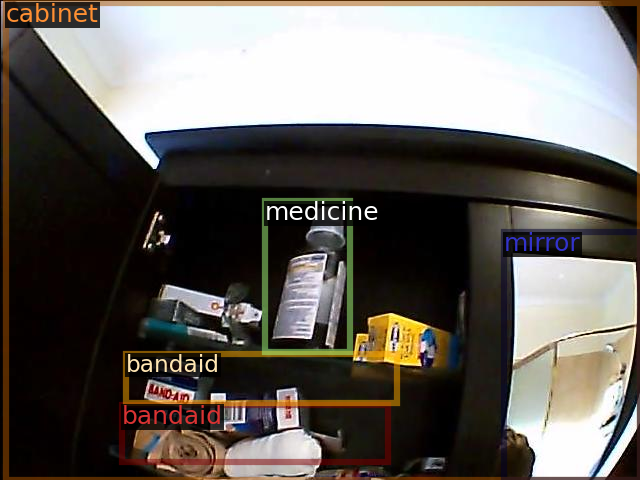

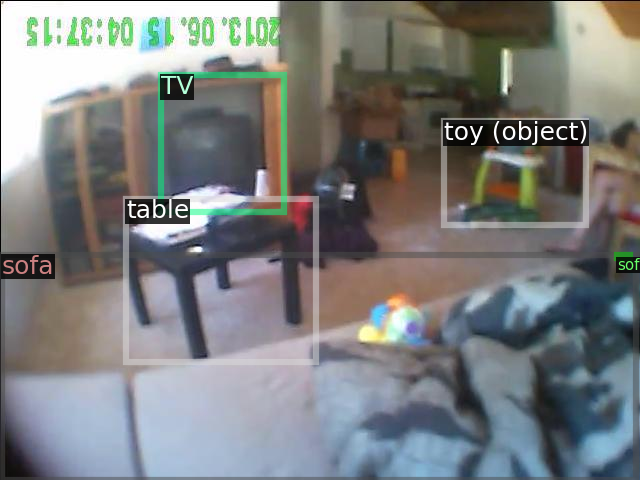

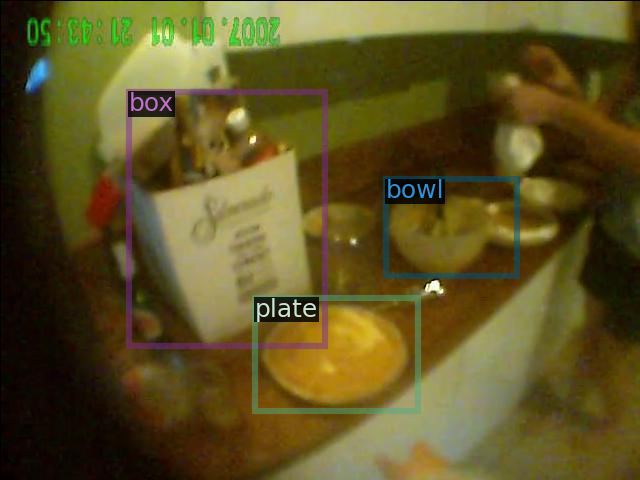

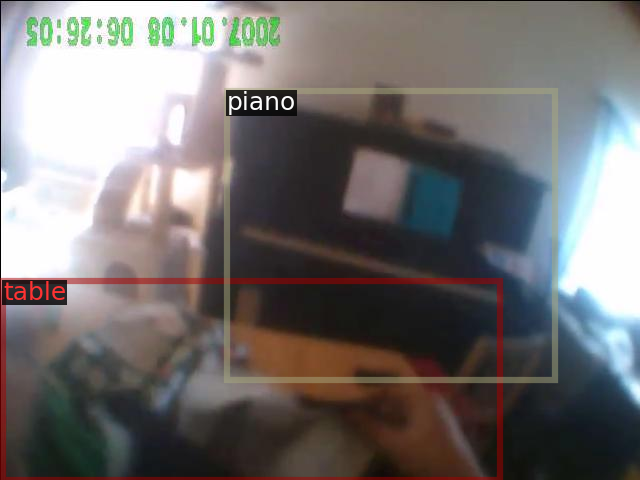

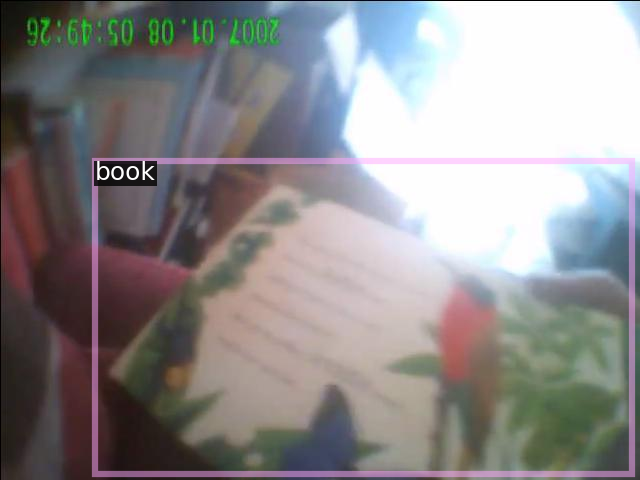

In [ ]:
d_dict = DatasetCatalog.get("dataset_toy1")
for d in d_dict:
  im = url_to_image(d['file_name'])
  #img = cv2.imread(im)
  #cv2_imshow(im)
  visualizer = Visualizer(im[:, :, ::-1], metadata=MetadataCatalog.get("dataset_toy1"))
  visualizer._default_font_size = 25
  out = visualizer.draw_dataset_dict(d)
  cv2_imshow(out.get_image()[:, :, ::-1])

## Train!

Now, let's fine-tune a COCO-pretrained R101-C4 Faster R-CNN model on the toy dataset. There are a lot of training parameters here that need to be considered and adjusted; putting this on my TODO to look into the docs and note what each parameter is.


In [ ]:
CUDA_LAUNCH_BLOCKING=1  # avoid getting a runtime error

In [ ]:
from detectron2.engine import DefaultTrainer, SimpleTrainer
import os
# ResNet101 + FPN object detection model
cfg = get_cfg()
print(cfg.OUTPUT_DIR)
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0025  # pick a good LR
cfg.SOLVER.MAX_ITER = 300    # 300 iterations seems good enough for this toy dataset; you may need to train longer for a practical dataset
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 354  # number of categories

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=True)
trainer.train()

./output
[08/05 23:01:48 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
 

model_final_f6e8b1.pkl: 243MB [02:09, 1.88MB/s]                          
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (355, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (355,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (1416, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (1416,) in the model! You might want to double check if this is expected.


[08/05 23:04:03 d2.engine.train_loop]: Starting training from iteration 0


21723-S_20141108_2422_01.AVI.mp4-6485.jpg: 41.0kB [00:00, 132kB/s]                             
11546-A_20150329_3016_03.mp4-13705.jpg: 49.2kB [00:00, 152kB/s]                             
18080-S_20140320_1703_01.mp4-5250.jpg: 41.0kB [00:00, 141kB/s]                             
14658-S_20130908_1022_04.mp4-15235.jpg: 41.0kB [00:00, 128kB/s]                             
22824-S_20150115_2629_01.mp4-16545.jpg: 0.00B [00:00, ?B/s]/usr/local/lib/python3.6/dist-packages/detectron2/layers/wrappers.py:226: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  return x.nonzero().unbind(1)
22824-S_20150115_2629_01.mp4-16545.jpg: 41.0kB [00:00, 137kB/s]                             
22150-S_20141206_2519_04.mp4-16010.jpg: 49.2kB [00:00, 156kB/s]                             
9314-A_20140803_2221_01.mp4-28155.jpg: 41.0kB [00

[08/05 23:04:11 d2.utils.events]:  eta: 0:01:44  iter: 19  total_loss: 6.630  loss_cls: 5.712  loss_box_reg: 0.368  loss_rpn_cls: 0.399  loss_rpn_loc: 0.059  time: 0.3656  data_time: 0.0310  lr: 0.000050  max_mem: 3224M
[08/05 23:04:18 d2.utils.events]:  eta: 0:01:32  iter: 39  total_loss: 4.953  loss_cls: 4.246  loss_box_reg: 0.428  loss_rpn_cls: 0.088  loss_rpn_loc: 0.049  time: 0.3562  data_time: 0.0053  lr: 0.000100  max_mem: 3224M
[08/05 23:04:26 d2.utils.events]:  eta: 0:01:26  iter: 59  total_loss: 1.983  loss_cls: 1.158  loss_box_reg: 0.309  loss_rpn_cls: 0.045  loss_rpn_loc: 0.033  time: 0.3615  data_time: 0.0064  lr: 0.000150  max_mem: 3224M
[08/05 23:04:33 d2.utils.events]:  eta: 0:01:19  iter: 79  total_loss: 1.550  loss_cls: 0.982  loss_box_reg: 0.463  loss_rpn_cls: 0.034  loss_rpn_loc: 0.043  time: 0.3638  data_time: 0.0064  lr: 0.000200  max_mem: 3224M
[08/05 23:04:40 d2.utils.events]:  eta: 0:01:12  iter: 99  total_loss: 1.563  loss_cls: 0.886  loss_box_reg: 0.451  loss

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set the testing threshold for this model
cfg.DATASETS.TEST = ("my_dataset_val", )
predictor = DefaultPredictor(cfg)

In [ ]:
from detectron2.modeling import build_model
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set the testing threshold for this model
cfg.DATASETS.TEST = ("my_dataset_val", )
predictor = DefaultPredictor(cfg)
#cfg.MODEL.ROI_HEADS.NUM_CLASSES = 354  # number of categories
model = build_model(cfg)  # returns a torch.nn.Module
evaluator = COCOEvaluator("my_dataset_val", cfg, False, output_dir="./")
val_loader = build_detection_test_loader(cfg, "my_dataset_val")
print(inference_on_dataset(model, val_loader, evaluator))

[08/05 22:25:00 d2.data.datasets.coco]: Loaded 10 images in COCO format from /content/drive/My Drive/CSLI/toyData.json
[08/05 22:25:00 d2.data.common]: Serializing 10 elements to byte tensors and concatenating them all ...
[08/05 22:25:00 d2.data.common]: Serialized dataset takes 0.00 MiB
[08/05 22:25:00 d2.data.dataset_mapper]: Augmentations used in training: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[08/05 22:25:00 d2.evaluation.evaluator]: Start inference on 10 images
[08/05 22:25:01 d2.evaluation.evaluator]: Total inference time: 0:00:00.469687 (0.093937 s / img per device, on 1 devices)
[08/05 22:25:01 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.074054 s / img per device, on 1 devices)
[08/05 22:25:01 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[08/05 22:25:01 d2.evaluation.coco_evaluation]: Saving results to ./coco_instances_results.json
[08/05 22:25:01 d2.evaluation.coco_evaluati

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("my_dataset_val", cfg, True, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_val")
print(inference_on_dataset(trainer.model, val_loader, evaluator))
# another equivalent way is to use trainer.test

[08/05 23:18:10 d2.data.datasets.coco]: Loaded 13 images in COCO format from /content/drive/My Drive/CSLI/pilotData2.json
[08/05 23:18:10 d2.data.build]: Distribution of instances among all 354 categories:
|   category    | #instances   |   category    | #instances   |   category    | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|:-------------:|:-------------|
|   airplane    | 0            |   alligator   | 2            |    animal     | 12           |
|      ant      | 0            |     apple     | 1            |  applesauce   | 0            |
|      art      | 22           |   backpack    | 0            |   backyard    | 0            |
|      bag      | 0            |     ball      | 1            |    balloon    | 0            |
|    banana     | 1            | baseball gl.. | 0            |    basket     | 3            |
|      bat      | 0            |    bathtub    | 0            |     beans     | 0            |
|     bear      | 2            |  

# Evaluate Performance

We run inference on our validation set using a model we train with our training set

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os
# "COCO-Detection/faster_rcnn_R_101_C4_3x.yaml"
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 354
 


trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=True)


[08/05 21:42:13 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

In [ ]:
dataset_dict = DatasetCatalog.get("my_dataset_val")
for d in dataset_dict:
    im = url_to_image(d["file_name"])
    outputs = predictor(im)
    print(outputs)

[08/05 21:54:52 d2.data.datasets.coco]: Loaded 10 images in COCO format from /content/drive/My Drive/CSLI/toyData.json
{'instances': Instances(num_instances=0, image_height=480, image_width=640, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}
{'instances': Instances(num_instances=0, image_height=480, image_width=640, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}
{'instances': Instances(num_instances=0, image_height=480, image_width=640, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}
{'instances': Instances(num_instances=0, image_height=480, image_width=640, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4)))

In [ ]:
#predictor = DefaultPredictor(cfg)
outputs = predictor(im)
# look at the outputs. See https://detectron2.readthedocs.io/tutorials/models.html#model-output-format for specification
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

In [ ]:
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])
    items = outputs["instances"].pred_classes.cpu().detach().numpy()
    items = list(items)
    print(items)

[08/05 21:39:59 d2.data.datasets.coco]: Loaded 10 images in COCO format from /content/drive/My Drive/CSLI/toyData.json
{'instances': Instances(num_instances=0, image_height=480, image_width=640, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


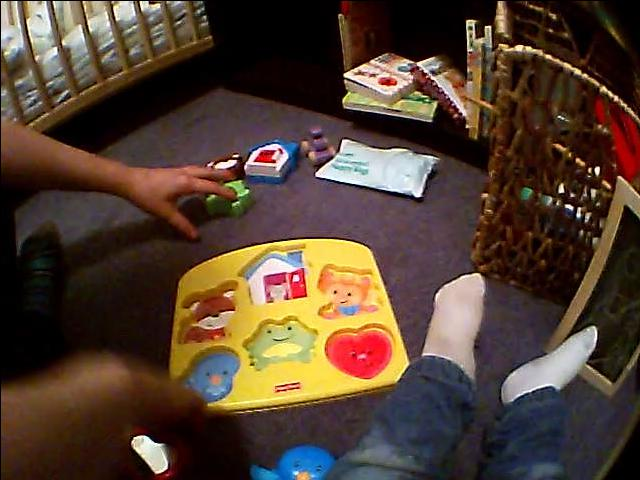

tensor([], device='cuda:0', dtype=torch.int64)
Boxes(tensor([], device='cuda:0', size=(0, 4)))
{'instances': Instances(num_instances=0, image_height=480, image_width=640, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


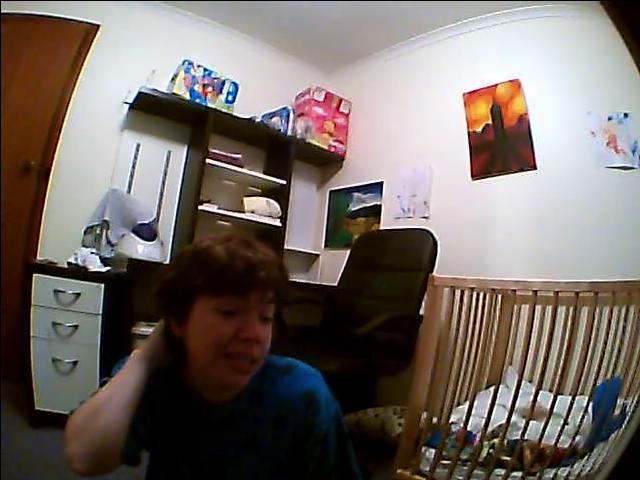

tensor([], device='cuda:0', dtype=torch.int64)
Boxes(tensor([], device='cuda:0', size=(0, 4)))
{'instances': Instances(num_instances=0, image_height=480, image_width=640, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


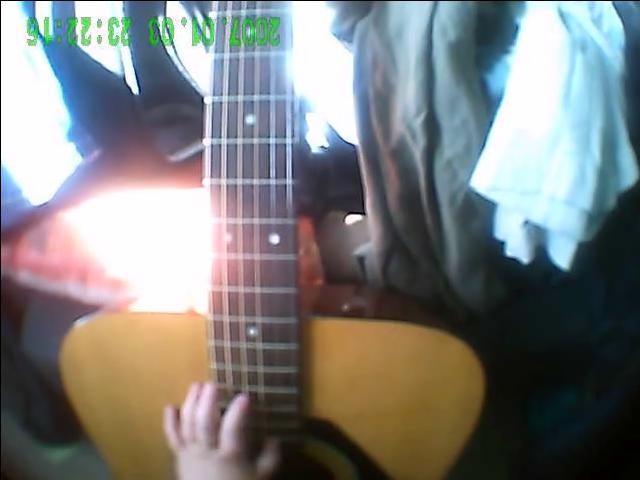

tensor([], device='cuda:0', dtype=torch.int64)
Boxes(tensor([], device='cuda:0', size=(0, 4)))
{'instances': Instances(num_instances=0, image_height=480, image_width=640, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


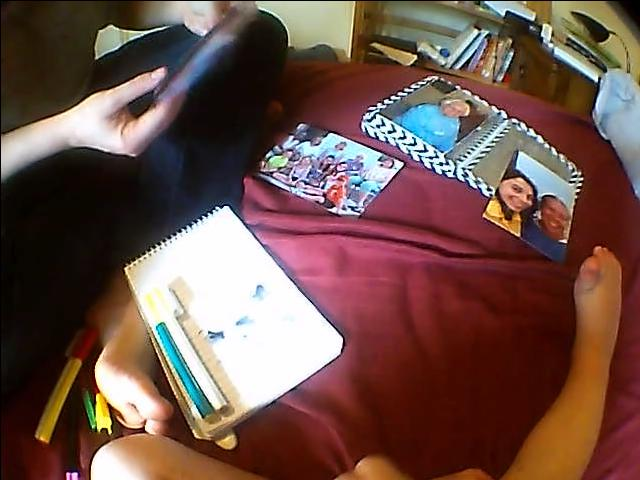

tensor([], device='cuda:0', dtype=torch.int64)
Boxes(tensor([], device='cuda:0', size=(0, 4)))
{'instances': Instances(num_instances=0, image_height=480, image_width=640, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


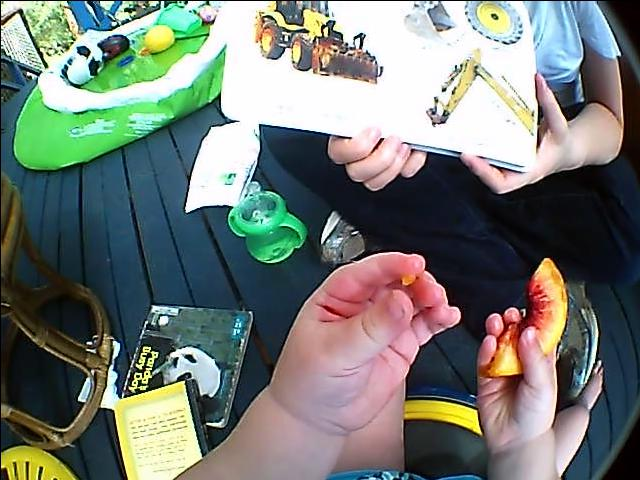

tensor([], device='cuda:0', dtype=torch.int64)
Boxes(tensor([], device='cuda:0', size=(0, 4)))
{'instances': Instances(num_instances=0, image_height=480, image_width=640, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


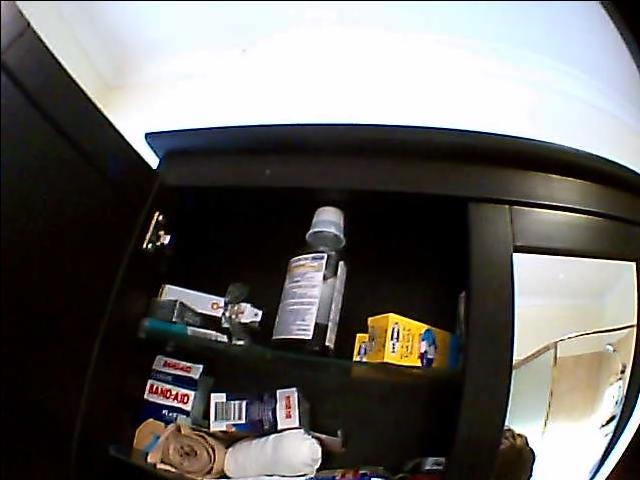

tensor([], device='cuda:0', dtype=torch.int64)
Boxes(tensor([], device='cuda:0', size=(0, 4)))
{'instances': Instances(num_instances=0, image_height=480, image_width=640, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


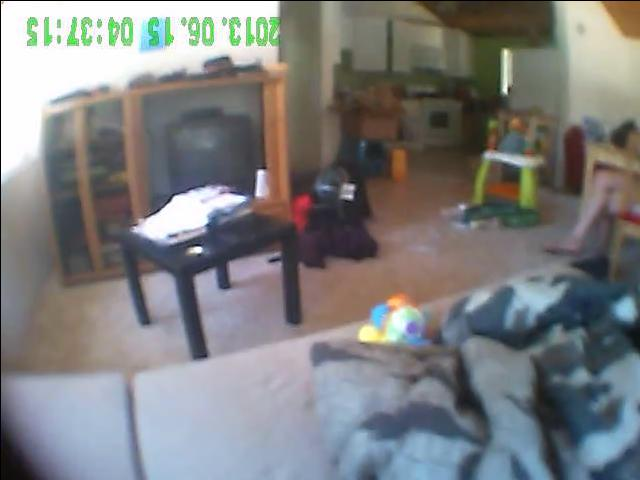

tensor([], device='cuda:0', dtype=torch.int64)
Boxes(tensor([], device='cuda:0', size=(0, 4)))
{'instances': Instances(num_instances=0, image_height=480, image_width=640, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


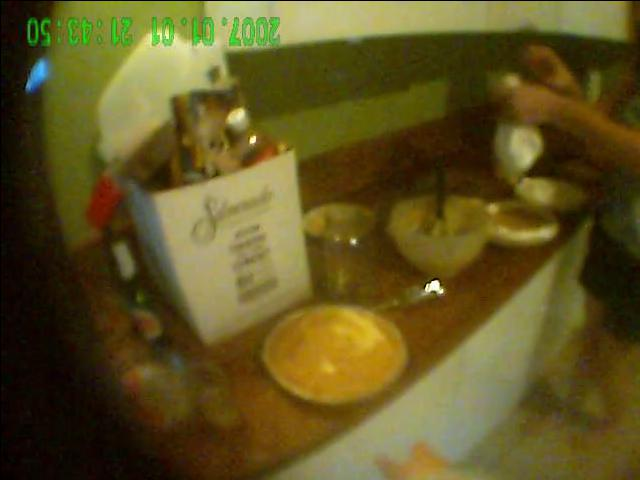

tensor([], device='cuda:0', dtype=torch.int64)
Boxes(tensor([], device='cuda:0', size=(0, 4)))
{'instances': Instances(num_instances=0, image_height=480, image_width=640, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


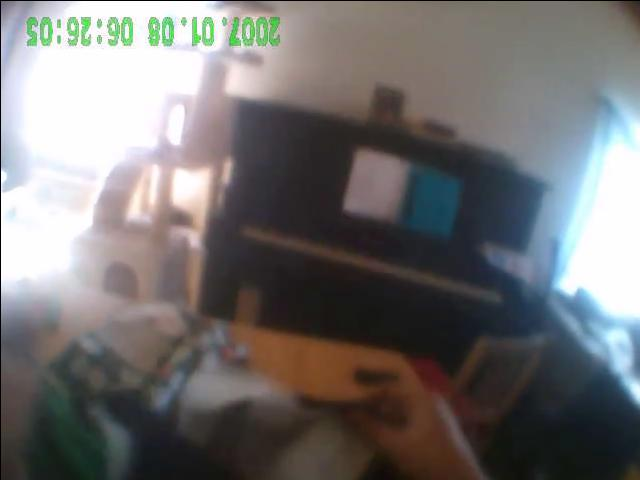

tensor([], device='cuda:0', dtype=torch.int64)
Boxes(tensor([], device='cuda:0', size=(0, 4)))
{'instances': Instances(num_instances=0, image_height=480, image_width=640, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


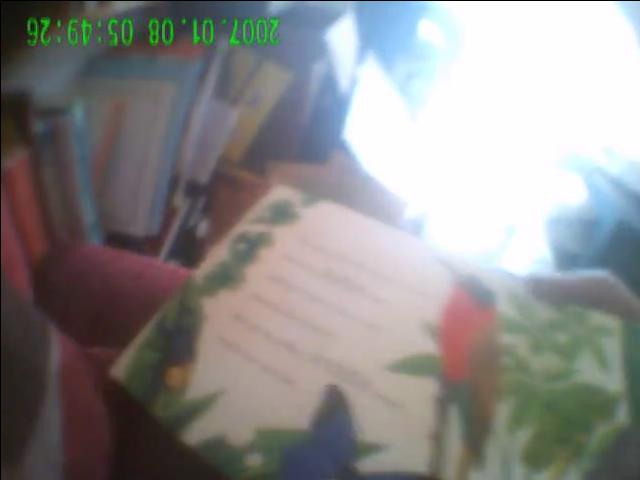

tensor([], device='cuda:0', dtype=torch.int64)
Boxes(tensor([], device='cuda:0', size=(0, 4)))


In [ ]:
dataset_dicts = DatasetCatalog.get("mydataset_val")
val_metadata = MetadataCatalog.get("mydataset_val")
train_metadata = MetadataCatalog.get("my_dataset_train")
for d in dataset_dicts:    
  im = url_to_image(d["file_name"])
  outputs = predictor(im)
  print(outputs)
  v = Visualizer(im[:, :, ::-1],
                  metadata=train_metadata, 
                    # remove the colors of unsegmented pixels
  )
  #out = v.draw_dataset_dict(d)
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])
  print(outputs["instances"].pred_classes)
  print(outputs["instances"].pred_boxes)

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold for this model
cfg.DATASETS.TEST = ("my_dataset_val", )
predictor = DefaultPredictor(cfg)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=True)

[08/05 20:32:58 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

In [ ]:
predictor(url_to_image(DatasetCatalog.get("mydataset_val")[0]['file_name']))

[08/05 21:41:08 d2.data.datasets.coco]: Loaded 10 images in COCO format from /content/drive/My Drive/CSLI/toyData.json


{'instances': Instances(num_instances=0, image_height=480, image_width=640, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}

Then, we randomly select several samples to visualize the prediction results.

In [ ]:
len(DatasetCatalog.get("my_dataset_train"))

[08/05 19:36:25 d2.data.datasets.coco]: Loaded 13 images in COCO format from /content/drive/My Drive/CSLI/pilotData1.json


13

In [ ]:
im = url_to_image(DatasetCatalog.get("my_dataset_train")[0]['file_name'])
#img = cv2.imread(im)
cv2_imshow(im)
visualizer = Visualizer(im[:, :, ::-1], metadata=MetadataCatalog.get("my_dataset_train"))
out = visualizer.draw_dataset_dict(DatasetCatalog.get("my_dataset_train")[0])
cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
metadata = MetadataCatalog.get("my_dataset_train")

In [ ]:
dataset_dict

[{'annotations': [{'bbox': [443, 292, 128, 113],
    'bbox_mode': <BoxMode.XYWH_ABS: 1>,
    'category_id': 323,
    'iscrowd': 0},
   {'bbox': [67, 329, 317, 108],
    'bbox_mode': <BoxMode.XYWH_ABS: 1>,
    'category_id': 323,
    'iscrowd': 0},
   {'bbox': [110, 171, 82, 69],
    'bbox_mode': <BoxMode.XYWH_ABS: 1>,
    'category_id': 323,
    'iscrowd': 0},
   {'bbox': [41, 184, 49, 64],
    'bbox_mode': <BoxMode.XYWH_ABS: 1>,
    'category_id': 323,
    'iscrowd': 0},
   {'bbox': [28, 255, 47, 191],
    'bbox_mode': <BoxMode.XYWH_ABS: 1>,
    'category_id': 323,
    'iscrowd': 0},
   {'bbox': [232, 206, 173, 96],
    'bbox_mode': <BoxMode.XYWH_ABS: 1>,
    'category_id': 323,
    'iscrowd': 0}],
  'file_name': 'http://langcog.stanford.edu/expts/saycam/frames/18080-S_20140320_1703_01.mp4-5250.jpg',
  'height': 480,
  'image_id': 5250,
  'width': 640}]

In [ ]:
for d in dataset_dict:
  print(d)

{'file_name': 'http://langcog.stanford.edu/expts/saycam/frames/18080-S_20140320_1703_01.mp4-5250.jpg', 'height': 480, 'width': 640, 'image_id': 5250, 'annotations': [{'iscrowd': 0, 'bbox': [443, 292, 128, 113], 'category_id': 323, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [67, 329, 317, 108], 'category_id': 323, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [110, 171, 82, 69], 'category_id': 323, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [41, 184, 49, 64], 'category_id': 323, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [28, 255, 47, 191], 'category_id': 323, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [232, 206, 173, 96], 'category_id': 323, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}


We can also evaluate its performance using AP metric implemented in COCO API.
This gives an AP of ~70. Not bad!